# Multi-Dimension Scaling (MDS)

Distance-preserving manifold learning method. All manifold learning algorithms assume the dataset lies on a smooth, non linear manifold of low dimension and that a mapping f: $R^{D}$ -> $R^{d}$ (D>>d) can be found by preserving one or more properties of the higher dimension space. Distance preserving methods assume that a manifold can be defined by the pairwise distances of its points. In distance preserving methods, a low dimensional embedding is obtained from the higher dimension in such a way that pairwise distances between the points remain same. Some distance preserving methods preserve spatial distances (MDS) while some preserve graph distances.

MDS is not a single method but a family of methods. MDS takes a dissimilarity matrix $D$ where $D_{ij}$ represents the dissimilarity between points $i$ and $j$ and produces a mapping on a lower dimension, preserving the dissimilarities as closely as possible. The dissimilarity matrix could be observed or calculated from the given dataset.

MDS can be divided into two categories:

- **Metric MDS** - Metric MDS is used for quantitative data and tries to preserve the original dissimilarity metrics. 

- **Non-Metric MDS** - Non-metric MDS is used for ordinal data. It tries to keep the order of dissimialrity metrics intact.

# t-Distributed Stochastic Neighbor Embedding (t-SNE)

t-Distributed Stochastic Neighbor Embedding (t-SNE) is a non-linear technique for dimensionality reduction that is particularly well suited for the visualization of high-dimensional datasets. It is extensively applied in image processing, NLP, genomic data and speech processing. To keep things simple, here’s a brief overview of working of t-SNE:

- The algorithms starts by calculating the probability of similarity of points in high-dimensional space and calculating the probability of similarity of points in the corresponding low-dimensional space. The similarity of points is calculated as the conditional probability that a point A would choose point B as its neighbor if neighbors were picked in proportion to their probability density under a Gaussian (normal distribution) centered at A.

- It then tries to minimize the difference between these conditional probabilities (or similarities) in higher-dimensional and lower-dimensional space for a perfect representation of data points in lower-dimensional space.

- To measure the minimization of the sum of difference of conditional probability t-SNE minimizes the sum of Kullback-Leibler divergence of overall data points using a gradient descent method.


In simpler terms, t-Distributed stochastic neighbor embedding (t-SNE) minimizes the divergence between two distributions: a distribution that measures pairwise similarities of the input objects and a distribution that measures pairwise similarities of the corresponding low-dimensional points in the embedding.

In this way, t-SNE maps the multi-dimensional data to a lower dimensional space and attempts to find patterns in the data by identifying observed clusters based on similarity of data points with multiple features. However, after this process, the input features are no longer identifiable, and you cannot make any inference based only on the output of t-SNE. Hence it is mainly a data exploration and visualization technique.

I recommend to familiarize with this amazing blogpost https://distill.pub/2016/misread-tsne/ which graphically shows traps associated with use of t-SNE and how  hyperparameters selection can  affect final embeding.



### To better illustrate properties of individual methods of reducing dimensionality (from this and previous lab), create a set of points in the shape of a roulade.  To do it:

1. Prepare a point generator for the circles in this generator, ensure that the radius decreases with the next steps (in this way you will get a spiral)

2. Treat the spiral as a cross-sectional solid, creating a croissant / crescent roll

3. Move the points in the roll with a slight noise to avoid their perfect placement

4. For better visualization, you can give individual points a color depending, e.g. on the distance from the center of the roulade

5. Generated roulade should resemble the picture below

In [1]:
from time import time
import math
import random
import mkl
import glob

import numpy as np
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt
from scipy import stats
from mpl_toolkits.mplot3d import Axes3D
from PIL import Image
from matplotlib.cbook import get_sample_data
from matplotlib.offsetbox import TextArea, DrawingArea, OffsetImage, AnnotationBbox
from IPython.display import Image
import tensorflow as tf
from tensorflow import keras

sn.set(color_codes=True)
np.random.seed(1234)
mkl.set_num_threads(4)
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.rcParams["figure.figsize"] = [20, 20]



## Roulade points generator

In [2]:
def random_spiral_point(density=2):
    p = random.random()**0.5
    return p*math.cos(p*density*np.pi*2), p*math.sin(p*density*np.pi*2)

def uniform_spiral(density=3, steps = 100):
    x, y = [] ,[]
    for i in range(steps):
        x.append((i/steps)**0.5*math.cos((i/steps)**0.5*density*np.pi*2))
        y.append((i/steps)**0.5*math.sin((i/steps)**0.5*density*np.pi*2))
        
    return x, y
        
def spiral2roll(xli, yli, width=7, angle=0.1):
    nx, ny, nz, d = [], [], [], []
    for x,y in zip(xli, yli):
        p = random.random()
        nx.append((width+x)*math.cos(angle*p*np.pi*2))
        ny.append((width+x)*math.sin(angle*p*np.pi*2))
        nz.append(y)
        d.append((x**2+y**2)**0.5)
    return nx, ny, nz, d

def uniform_roll(xli, yli, width=7, angle=0.25, density=5, noise_factor=0.05):
    nx, ny, nz, d = [], [], [], []
    d1 = [((x**2+y**2)**0.5) for x,y in zip(xli, yli)]
    for i in range(density):
        nx.extend([(width+x)*math.cos(angle*i/density*np.pi*2) + (random.random()-0.5)*noise_factor for x in xli])
        ny.extend([(width+x)*math.sin(angle*i/density*np.pi*2) + (random.random()-0.5)*noise_factor  for x in xli])
        nz.extend(yli)
        d.extend(d1) 
    return nx, ny, nz, d  


def roll_generator(to_array=True, spiral_density=3, spiral_steps = 20, width=7, angle=0.3, density=5):
    x, y = uniform_spiral(density=spiral_density, steps = spiral_steps)
    x,y,z,d = uniform_roll(x, y, width=width, angle=angle, density=density)
       
    if to_array:
        return np.array([x,y,z]).T, d
    else:
        return x,y,z,d
        

In [3]:
def plot_roulade(x,y,z,d=None):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(x, y, z, c=d, cmap=plt.cm.coolwarm)
    ax.set_xlabel('X Label')
    ax.set_ylabel('Y Label')
    ax.set_zlabel('Z Label')
    ax.set_xlim([-6, 6])
    ax.set_ylim([-6, 6])
    ax.set_zlim([-6, 6])
    

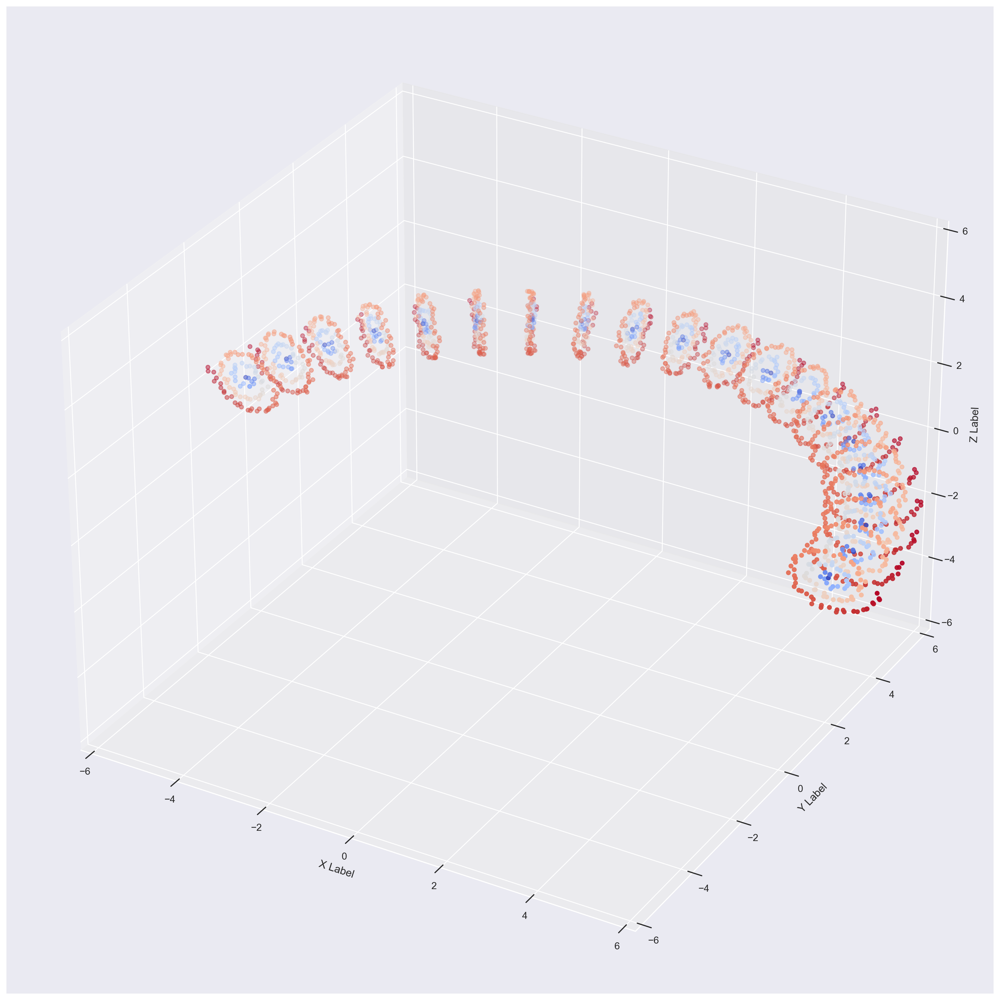

In [4]:
xl, yl = uniform_spiral()
x,y,z,d = uniform_roll(xl,yl, width=7, angle=0.5, density=20, noise_factor=0.15)
plot_roulade(x,y,z,d=d)

#### Visualize the prepared set of points by projecting onto a 2D plane, changing the following aspects in subsequent approaches:

1. Density of points generated, in terms of points per spiral

2. Distance between roll layers, layer density

3. Visualization method: PCA, KernelPCA, MDS, t-SNE

4. generate at least a few plots per method


#### Save each generated chart, you will later need it to embeding images

#### PCA implementation

In [5]:
def show_PCA(spiral_density=3, spiral_steps = 20, width=7, angle=0.5, roll_density=5):
    fig = plt.figure()
    x,y,z,d=roll_generator(to_array=False, spiral_density=spiral_density,
                           spiral_steps = spiral_steps, width=width,
                           angle=angle, density=roll_density)
    from mpl_toolkits.mplot3d import Axes3D

    ax = fig.add_subplot(121, projection='3d')
    ax.scatter(x, y, z, c=d, cmap=plt.cm.coolwarm)
    ax.set_xlabel('X Label')
    ax.set_ylabel('Y Label')
    ax.set_zlabel('Z Label')
    ax.set_xlim([-6, 6])
    ax.set_ylim([-6, 6])
    ax.set_zlim([-6, 6])

    ax2 = fig.add_subplot(122)
    points, d=roll_generator(to_array=True, spiral_density=spiral_density,
                           spiral_steps = spiral_steps, width=width,
                           angle=angle, density=roll_density)

    from sklearn.decomposition import PCA
    embedding = PCA(n_components=2)
    points_transformed = embedding.fit_transform(points)

    points_transformed_t = points_transformed.T

    ax2.scatter(points_transformed_t[0], points_transformed_t[1], c=d, cmap=plt.cm.coolwarm)
    ax2.set_xlabel('X Label')
    ax2.set_ylabel('Y Label')
    
    plt.rcParams["figure.figsize"] = [12, 6]
    
    extent = ax2.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    fig.savefig(f'pca_spst{spiral_steps}_roldens{roll_density}_w{width}_a{angle}_sd{spiral_density}.png', bbox_inches=extent)

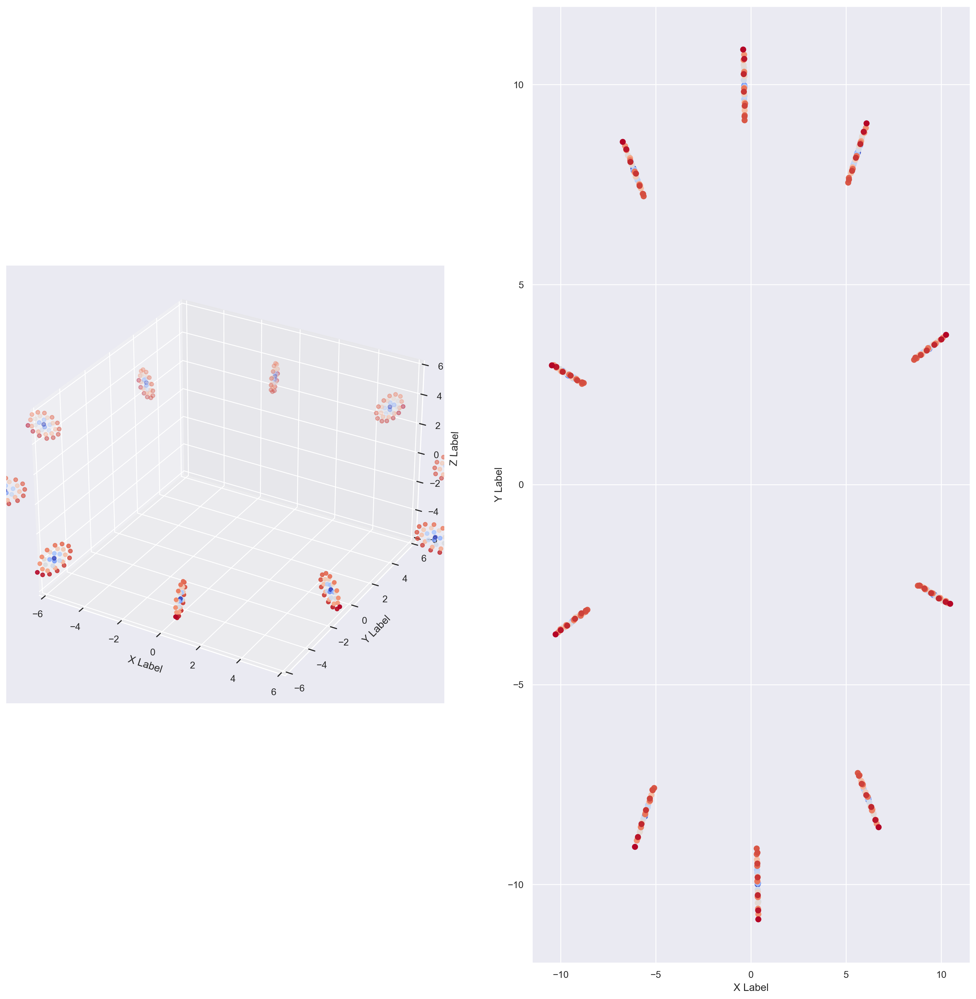

In [6]:
show_PCA(spiral_density=4, spiral_steps = 30, width=10, angle=1, roll_density=10)

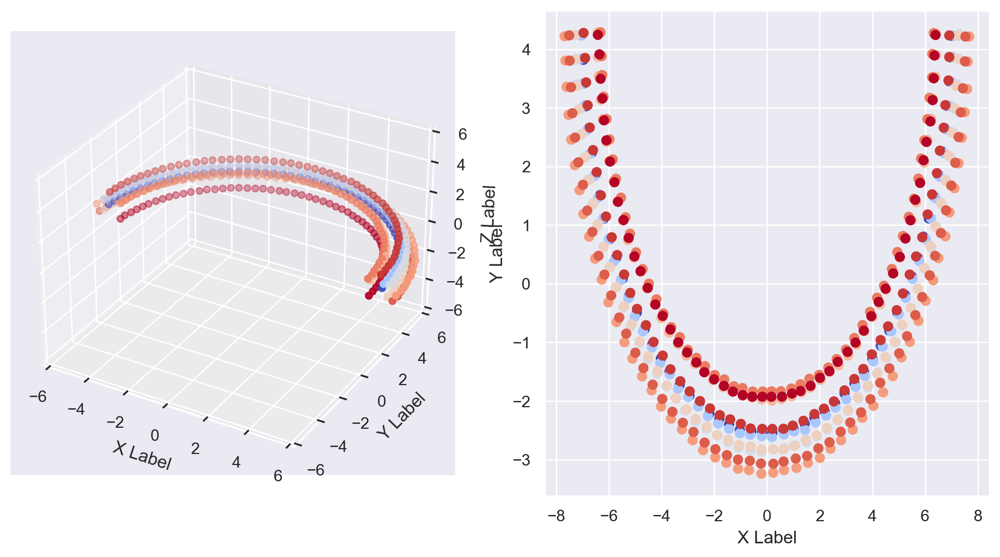

In [7]:
show_PCA(spiral_density=7, spiral_steps = 10, width=7, angle=0.5, roll_density=54)

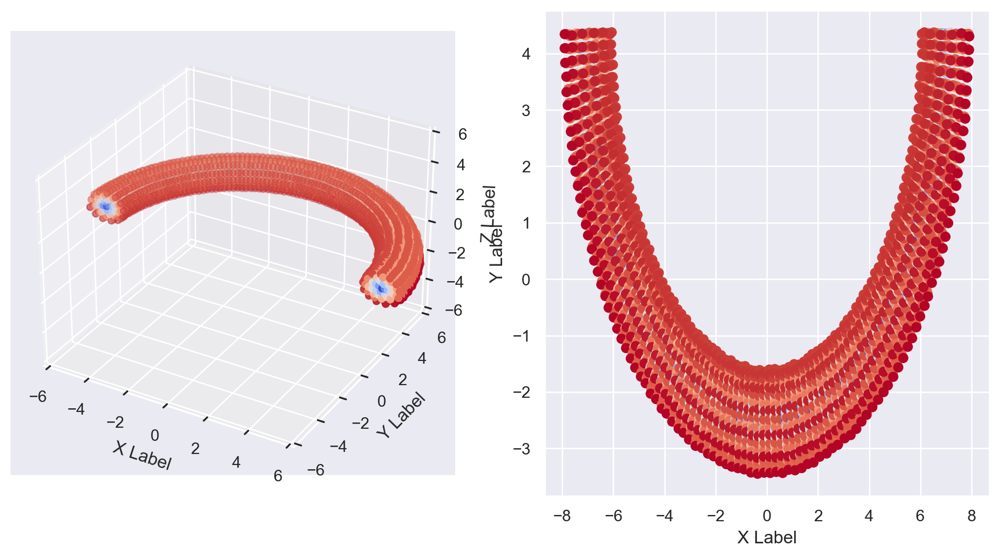

In [8]:
show_PCA(spiral_density=7, spiral_steps = 50, width=7, angle=0.5, roll_density=100)

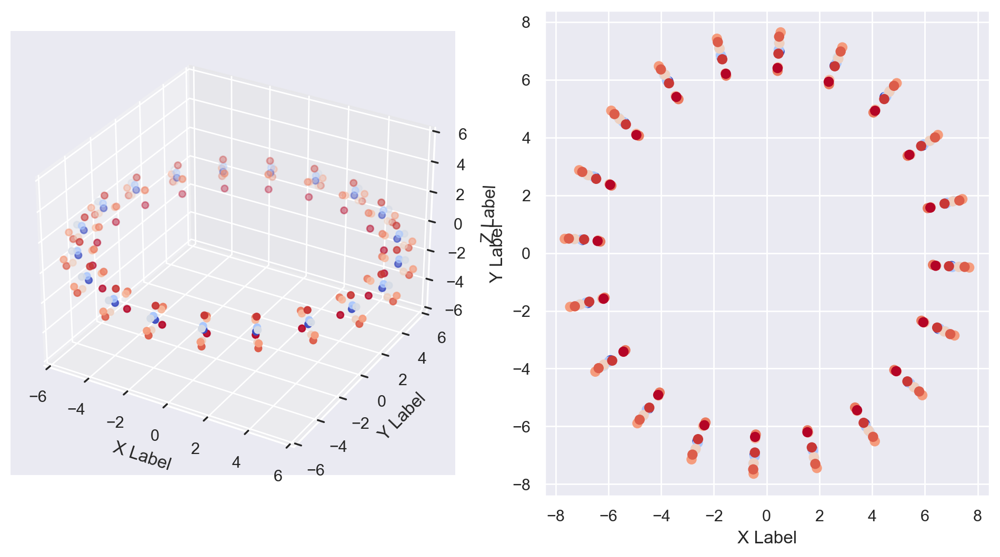

In [9]:
show_PCA(spiral_density=7, spiral_steps = 10, width=7, angle=1, roll_density=20)

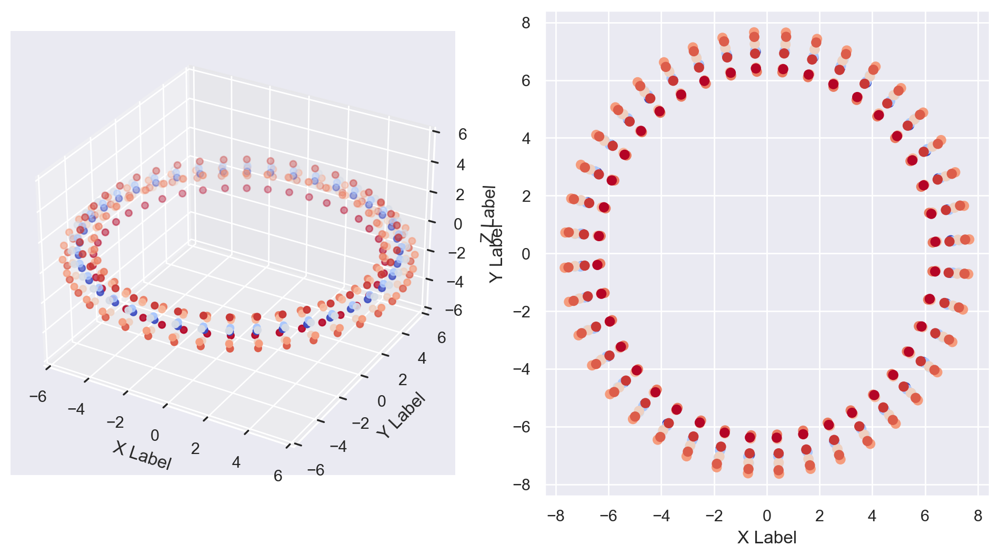

In [10]:
show_PCA(spiral_density=7, spiral_steps = 10, width=7, angle=1, roll_density=40)

In [11]:
def show_KernelPCA(spiral_density=3, spiral_steps = 20, width=7, angle=0.5, roll_density=5):
    fig = plt.figure()
    x,y,z,d=roll_generator(to_array=False, spiral_density=spiral_density,
                           spiral_steps = spiral_steps, width=width,
                           angle=angle, density=roll_density)
    from mpl_toolkits.mplot3d import Axes3D

    ax = fig.add_subplot(121, projection='3d')
    ax.scatter(x, y, z, c=d, cmap=plt.cm.coolwarm)
    ax.set_xlabel('X Label')
    ax.set_ylabel('Y Label')
    ax.set_zlabel('Z Label')
    ax.set_xlim([-6, 6])
    ax.set_ylim([-6, 6])
    ax.set_zlim([-6, 6])

    ax2 = fig.add_subplot(122)
    points, d=roll_generator(to_array=True, spiral_density=spiral_density,
                           spiral_steps = spiral_steps, width=width,
                           angle=angle, density=roll_density)

    from sklearn.decomposition import KernelPCA
    embedding = KernelPCA(n_components=2)
    points_transformed = embedding.fit_transform(points)

    points_transformed_t = points_transformed.T

    ax2.scatter(points_transformed_t[0], points_transformed_t[1], c=d, cmap=plt.cm.coolwarm)
    ax2.set_xlabel('X Label')
    ax2.set_ylabel('Y Label')
    
    plt.rcParams["figure.figsize"] = [12, 6]
    
    extent = ax2.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    fig.savefig(f'kpca_spst{spiral_steps}_roldens{roll_density}_w{width}_a{angle}_sd{spiral_density}.png', bbox_inches=extent)

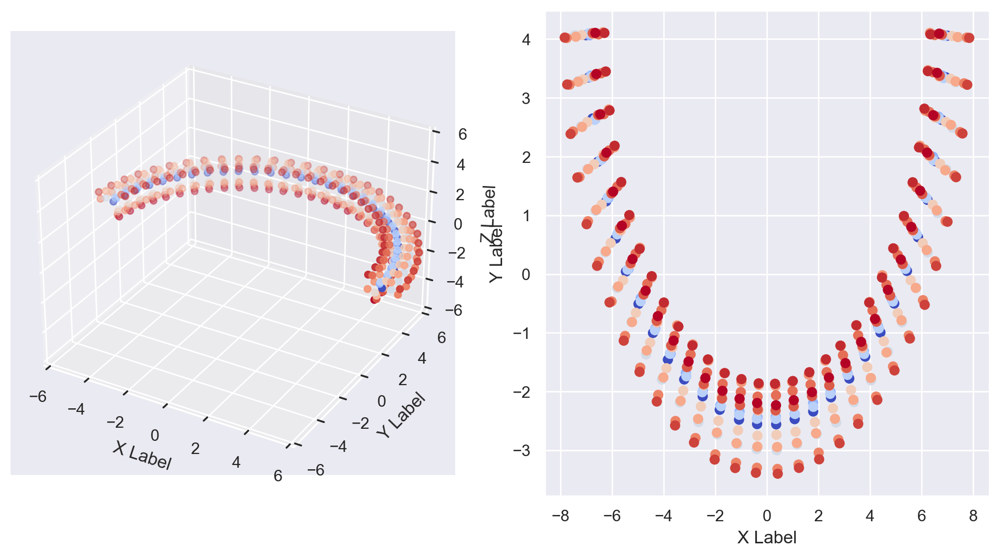

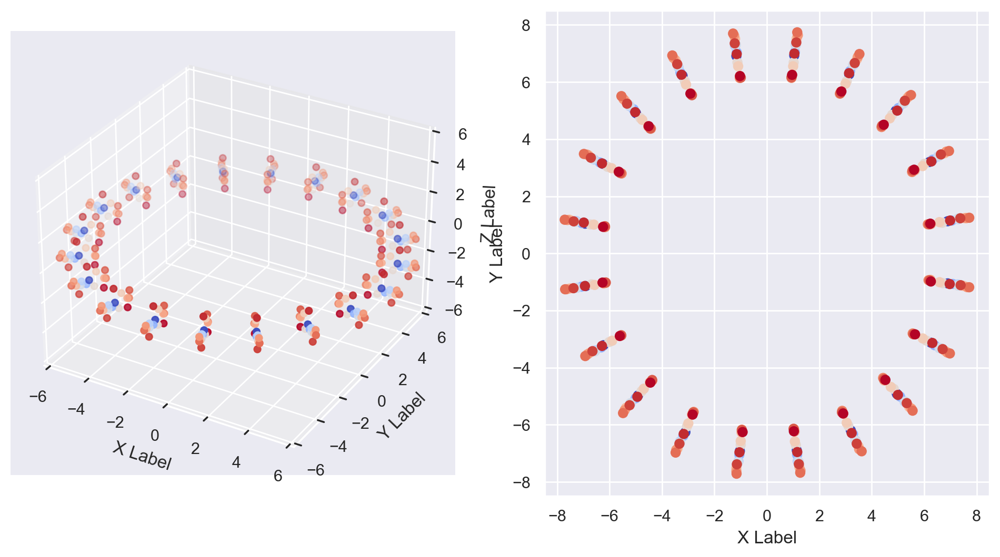

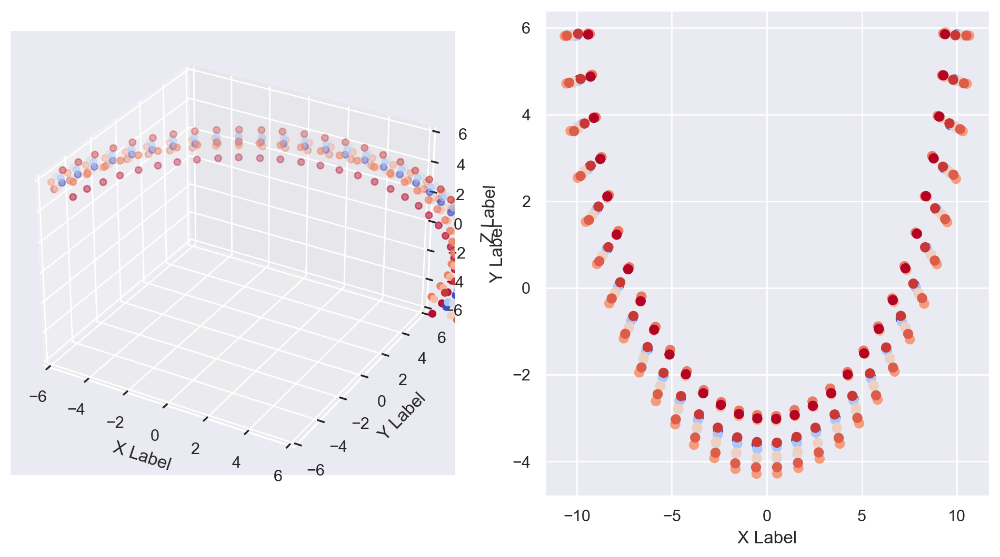

In [12]:
show_KernelPCA(spiral_density=9, spiral_steps = 15, width=7, angle=0.5, roll_density=30)
show_KernelPCA(spiral_density=11, spiral_steps = 15, width=7, angle=1, roll_density=20)
show_KernelPCA(spiral_density=7, spiral_steps = 10, width=10, angle=0.5, roll_density=30)

#### MDS implementation

In [13]:
def show_MDS(spiral_density=3, spiral_steps = 20, width=7, angle=0.5, roll_density=5):
    fig = plt.figure()
    x,y,z,d=roll_generator(to_array=False, spiral_density=spiral_density,
                           spiral_steps = spiral_steps, width=width,
                           angle=angle, density=roll_density)
    from mpl_toolkits.mplot3d import Axes3D

    ax = fig.add_subplot(121, projection='3d')
    ax.scatter(x, y, z, c=d, cmap=plt.cm.coolwarm)
    ax.set_xlabel('X Label')
    ax.set_ylabel('Y Label')
    ax.set_zlabel('Z Label')
    ax.set_xlim([-6, 6])
    ax.set_ylim([-6, 6])
    ax.set_zlim([-6, 6])

    ax2 = fig.add_subplot(122)
    points, d=roll_generator(to_array=True, spiral_density=spiral_density,
                           spiral_steps = spiral_steps, width=width,
                           angle=angle, density=roll_density)

    from sklearn.manifold import MDS
    embedding = MDS(n_components=2)
    points_transformed = embedding.fit_transform(points)

    points_transformed_t = points_transformed.T

    ax2.scatter(points_transformed_t[0], points_transformed_t[1], c=d, cmap=plt.cm.coolwarm)
    ax2.set_xlabel('X Label')
    ax2.set_ylabel('Y Label')
    
    plt.rcParams["figure.figsize"] = [12, 6]
    
    extent = ax2.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    fig.savefig(f'mds_spst{spiral_steps}_roldens{roll_density}_w{width}_a{angle}_sd{spiral_density}.png', bbox_inches=extent)

C:\Users\KlaudiaDyl\miniforge3\envs\minifold\Lib\site-packages\sklearn\manifold\_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
C:\Users\KlaudiaDyl\miniforge3\envs\minifold\Lib\site-packages\sklearn\manifold\_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
C:\Users\KlaudiaDyl\miniforge3\envs\minifold\Lib\site-packages\sklearn\manifold\_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
C:\Users\KlaudiaDyl\miniforge3\envs\minifold\Lib\site-packages\sklearn\manifold\_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to

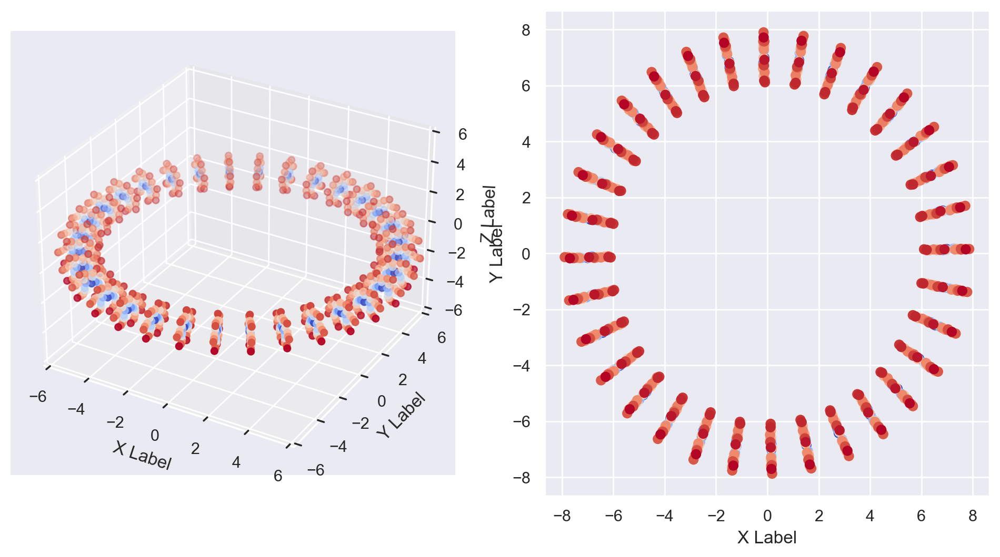

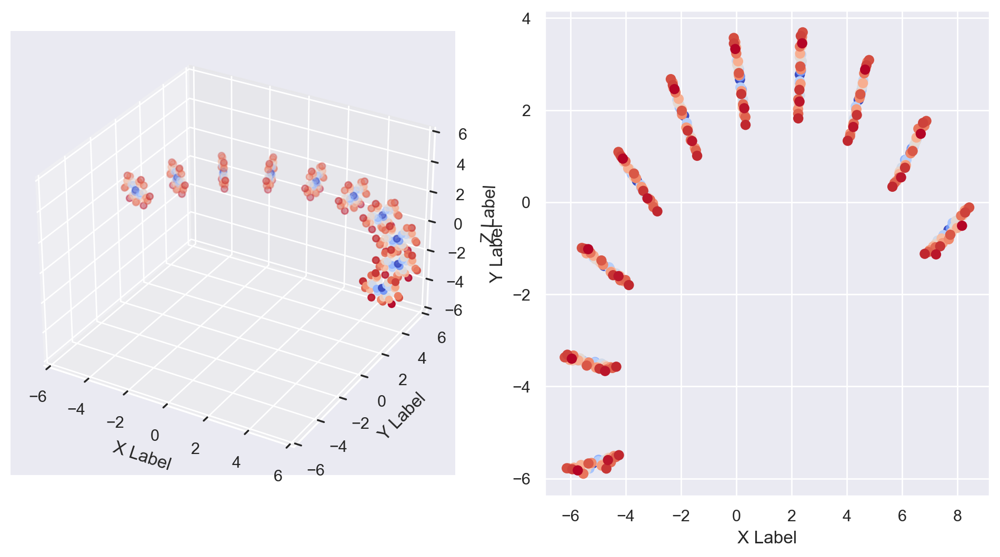

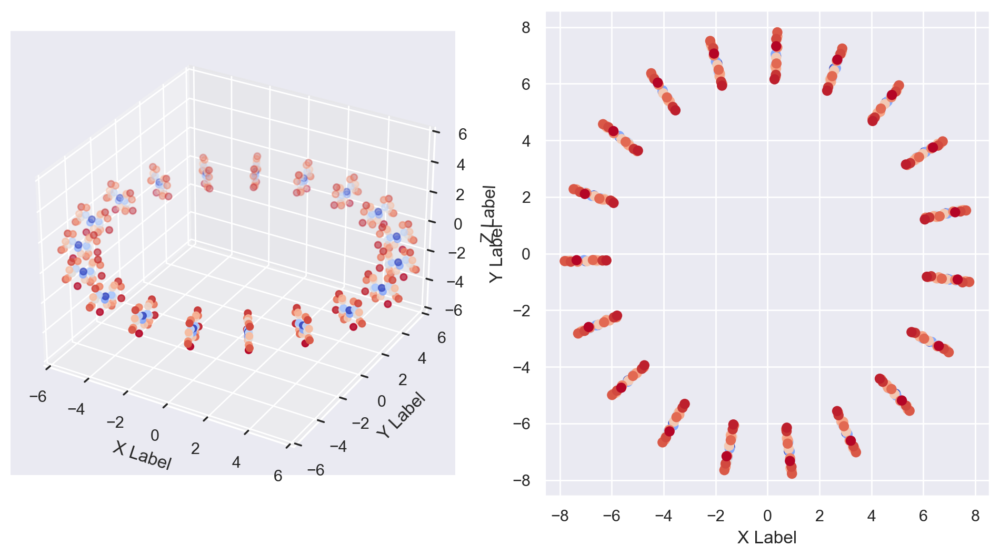

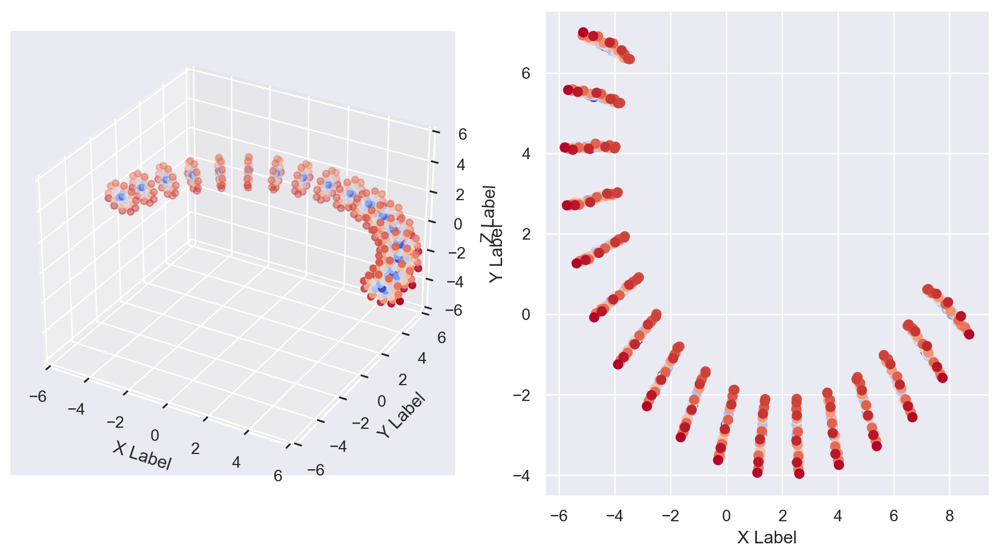

In [14]:
show_MDS(spiral_density=8, spiral_steps = 30, width=7, angle=1, roll_density=32)
show_MDS(spiral_density=10, spiral_steps = 30, width=7, angle=0.5, roll_density=10)
show_MDS(spiral_density=8, spiral_steps = 20, width=7, angle=1, roll_density=19)
show_MDS(spiral_density=5, spiral_steps = 30, width=7, angle=0.5, roll_density=17)

#### t-SNE implementation

In [15]:

def show_tSNE(spiral_density=3, spiral_steps = 20, width=7, angle=0.5, roll_density=5, n_neighbors=5,
              metric='euclidean', perplexity=30):
    fig = plt.figure()
    x,y,z,d=roll_generator(to_array=False, spiral_density=spiral_density,
                           spiral_steps = spiral_steps, width=width,
                           angle=angle, density=roll_density)
    from mpl_toolkits.mplot3d import Axes3D

    ax = fig.add_subplot(121, projection='3d')
    ax.scatter(x, y, z, c=d, cmap=plt.cm.coolwarm)
    ax.set_xlabel('X Label')
    ax.set_ylabel('Y Label')
    ax.set_zlabel('Z Label')
    ax.set_xlim([-6, 6])
    ax.set_ylim([-6, 6])
    ax.set_zlim([-6, 6])

    ax2 = fig.add_subplot(122)
    points, d=roll_generator(to_array=True, spiral_density=spiral_density,
                           spiral_steps = spiral_steps, width=width,
                           angle=angle, density=roll_density)

    from sklearn.manifold import TSNE
    points_transformed = TSNE(n_components=2, metric=metric, perplexity=perplexity).fit_transform(points)
    
    points_transformed_t = points_transformed.T


    ax2.scatter(points_transformed_t[0], points_transformed_t[1], c=d, cmap=plt.cm.coolwarm)
    ax2.set_xlabel('X Label')
    ax2.set_ylabel('Y Label')
    
    plt.rcParams["figure.figsize"] = [12, 6]
    
    extent = ax2.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    fig.savefig(f'tsne_n{n_neighbors}_spst{spiral_steps}_roldens{roll_density}_w{width}_a{angle}_sd{spiral_density}.png', bbox_inches=extent)

In [16]:
# TODO - here results are most varied depending on the parameters used (above all perplexity)

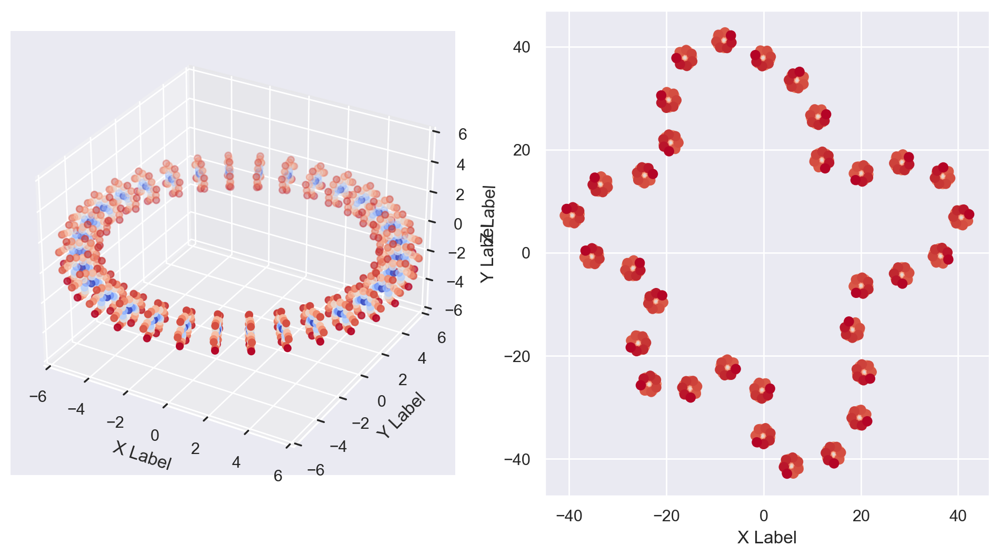

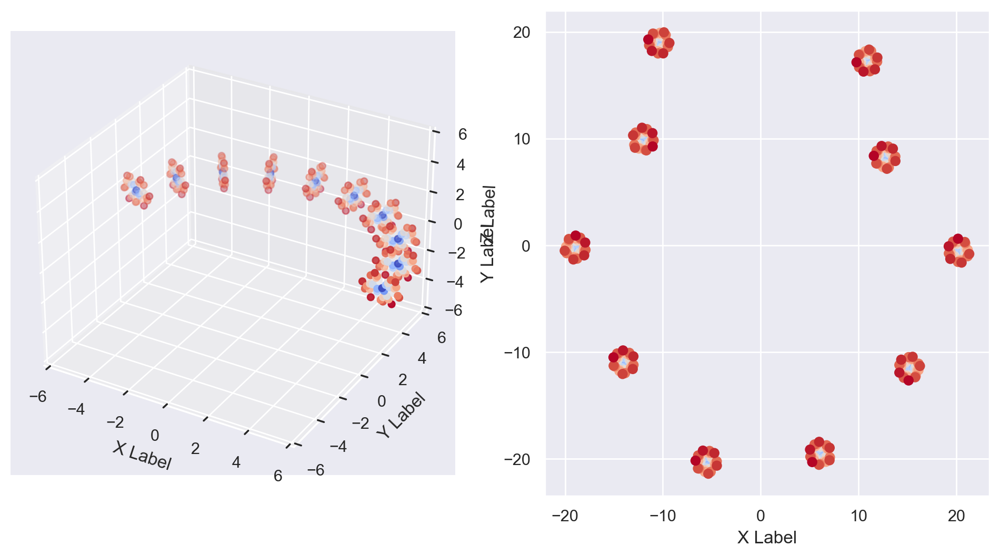

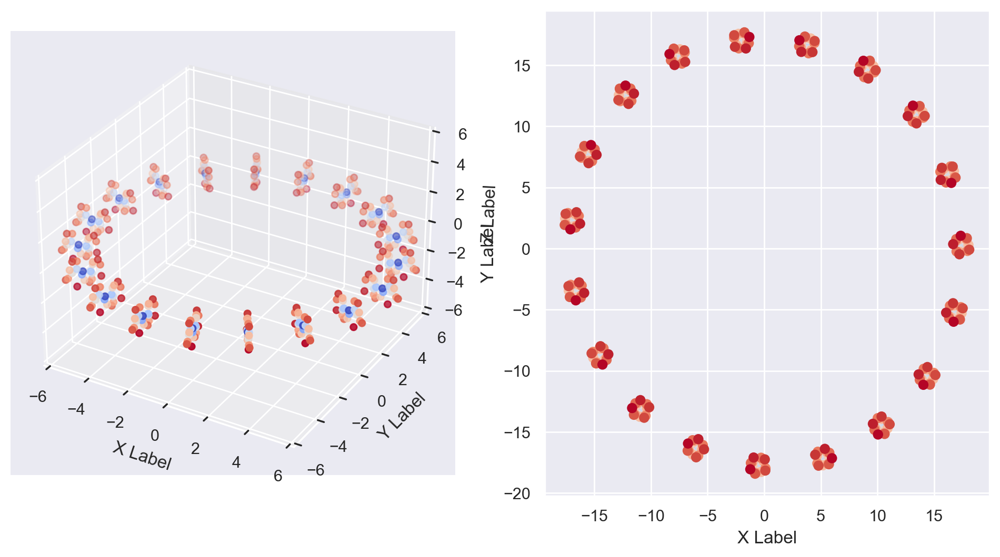

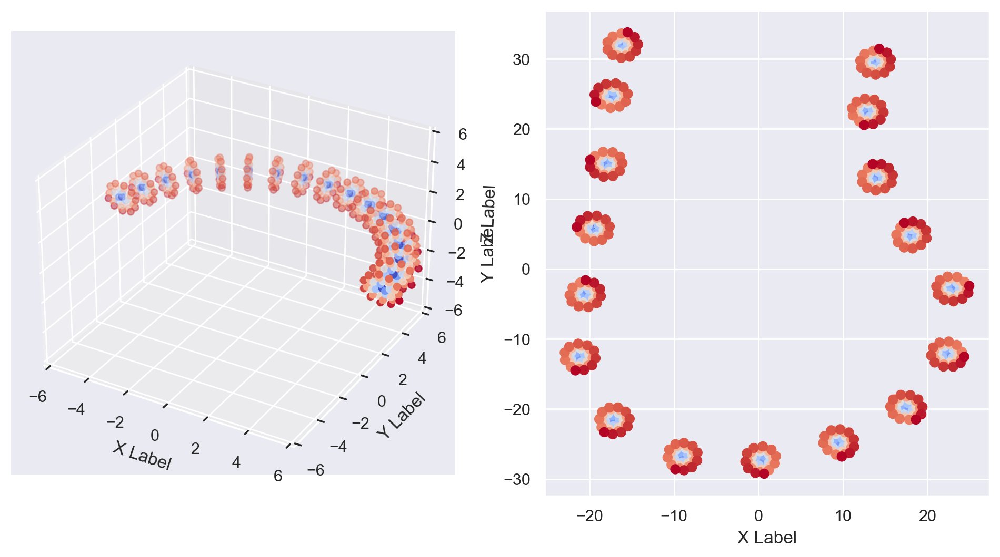

In [17]:
show_tSNE(spiral_density=8, spiral_steps = 30, width=7, angle=1, roll_density=32)
show_tSNE(spiral_density=10, spiral_steps = 30, width=7, angle=0.5, roll_density=10)
show_tSNE(spiral_density=8, spiral_steps = 20, width=7, angle=1, roll_density=19)
show_tSNE(spiral_density=5, spiral_steps = 30, width=7, angle=0.5, roll_density=17)

### In this way, you should get a set of images showing the various available projections of the original roulade to the 2D plane. Treat these images as elements of a new data set, we treat image pixels as a high-dimensional vector. Use t-SNE to project the newly created set of 2d projection thumbnails into a 2-dimensional space.

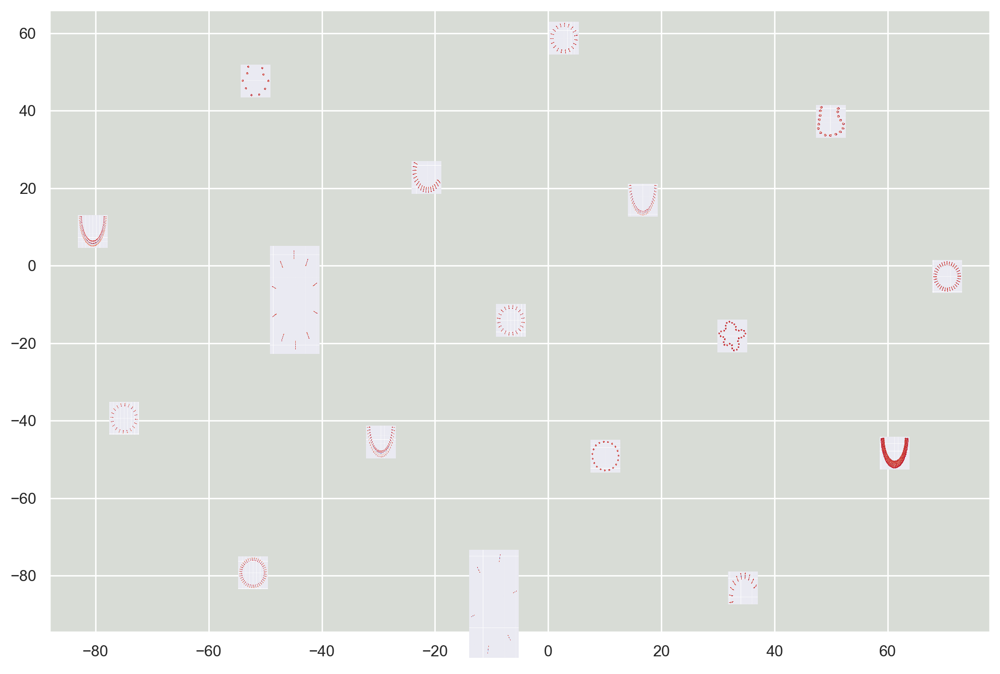

In [18]:
from sklearn.manifold import TSNE
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from PIL import Image
import matplotlib.image as mpimg

# Ścieżki do obrazów, które chcesz przetworzyć
image_paths = [
   'kpca_spst10_roldens30_w10_a0.5_sd7.png',
    'kpca_spst15_roldens20_w7_a1_sd11.png',
    'kpca_spst15_roldens30_w7_a0.5_sd9.png',
    'mds_spst20_roldens19_w7_a1_sd8.png',
    'mds_spst30_roldens10_w7_a0.5_sd10.png',
    'mds_spst30_roldens17_w7_a0.5_sd5.png',
    'mds_spst30_roldens32_w7_a1_sd8.png',
    'pca_spst10_roldens20_w7_a1_sd7.png',
    'pca_spst10_roldens40_w7_a1_sd7.png',
    'pca_spst10_roldens54_w7_a0.5_sd7.png',
    'pca_spst15_roldens6_w10_a1_sd4.png',
    'pca_spst30_roldens10_w10_a1_sd4.png',
    'pca_spst50_roldens100_w7_a0.5_sd7.png',
    'tsne_n5_spst20_roldens19_w7_a1_sd8.png',
    'tsne_n5_spst30_roldens10_w7_a0.5_sd10.png',
    'tsne_n5_spst30_roldens17_w7_a0.5_sd5.png',
    'tsne_n5_spst30_roldens32_w7_a1_sd8.png'
    # ... i tak dalej dla wszystkich obrazów
]

# Wczytaj obrazy i przekonwertuj je do spłaszczonej formy
data_images = []
for path in image_paths:
    image = Image.open(path)
    image = image.resize((100, 100))  # Dostosuj do potrzebnego rozmiaru
    data_images.append(np.array(image).flatten())

data_np = np.array(data_images)

# Aby uniknąć błędu, ustawiamy perplexity na mniejszą wartość niż liczba próbek
perplexity_value = min(30, len(data_np)-1)  # gdzie 30 to wcześniej preferowana wartość

tsne = TSNE(n_components=2, learning_rate='auto', init='pca', perplexity=perplexity_value)
points_transformed = tsne.fit_transform(data_np)

# Wizualizacja wyniku


fig, ax = plt.subplots(figsize=(12, 8))  # Ustaw większy rozmiar wykresu
ax.set_facecolor('xkcd:light grey')

for path, position in zip(image_paths, points_transformed):
    image = mpimg.imread(path)
    im = OffsetImage(image, zoom=0.05)  # Zmniejsz zoom
    ab = AnnotationBbox(im, (position[0], position[1]), frameon=False)
    ax.scatter(position[0], position[1], marker='o', s=20, color='xkcd:gray')  # Możesz zmniejszyć rozmiar punktu
    ax.add_artist(ab)

# Możesz również dostosować limity osi, jeśli jest to konieczne
# ax.set_xlim([-100, 100])
# ax.set_ylim([-100, 100])

plt.show()

for path, position in zip(image_paths, points_transformed):
    image = mpimg.imread(path)
    im = OffsetImage(image, zoom=0.1)  # Dostosuj zoom do rozmiaru Twoich obrazów
    ab = AnnotationBbox(im, (position[0], position[1]), frameon=False)
    ax.scatter(position[0], position[1], marker='o', s=0, color='xkcd:gray')
    ax.add_artist(ab)

plt.show()


In [19]:
pip install pandas


Note: you may need to restart the kernel to use updated packages.


In [20]:
import sklearn.datasets
import pandas as pd
import numpy as np
import seaborn as sn
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import umap

In [29]:
from sklearn.datasets import fetch_openml

mnist = fetch_openml('mnist_784', version=1, parser='auto')


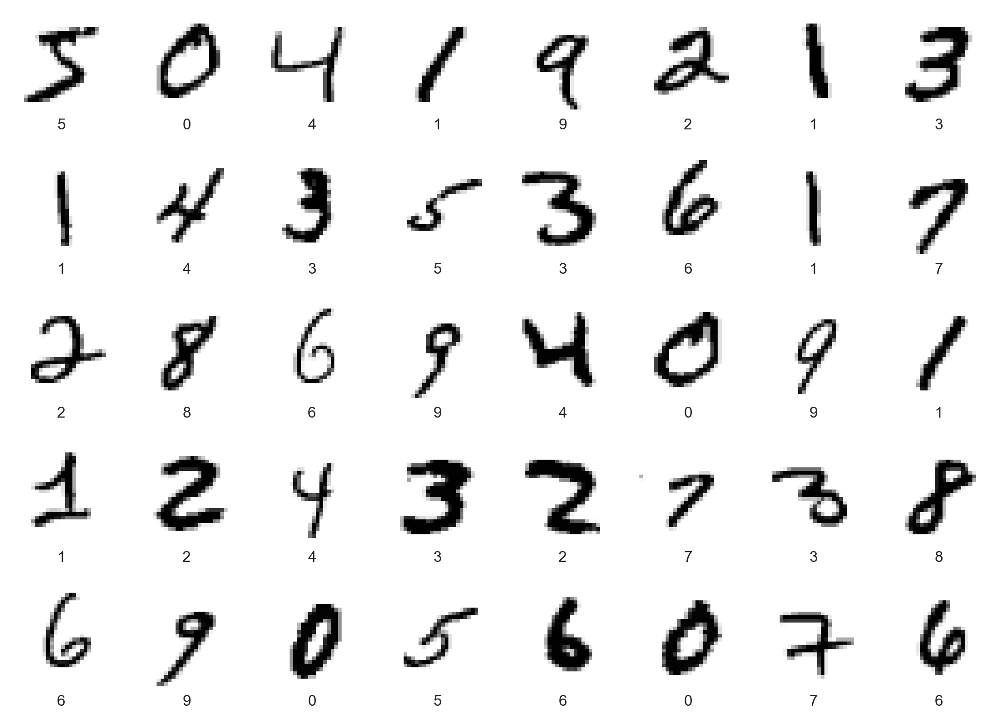

In [30]:
mnist_names = [i for i in range(10)]
 
plt.figure(figsize=(14,10))
for i in range(40):
    plt.subplot(5, 8, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(np.array(mnist.data.iloc[i]).reshape((28, 28)), cmap=plt.cm.binary)
    plt.xlabel(mnist_names[int(mnist.target[i])])
plt.show()

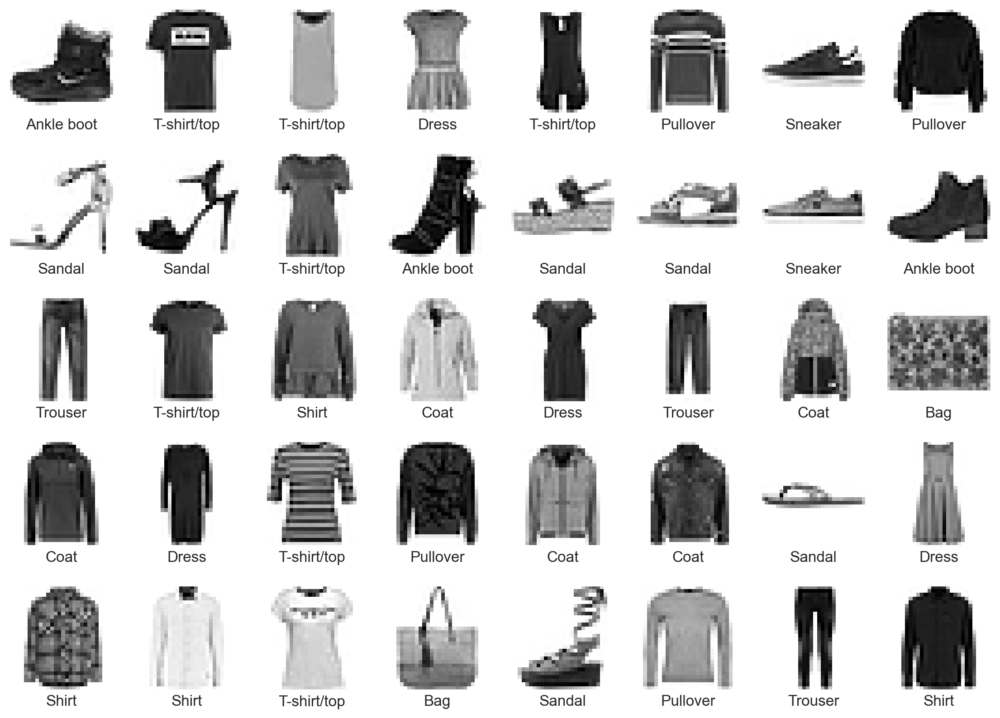

In [31]:
import numpy as np
import matplotlib.pyplot as plt

# Przykładowe nazwy klas dla fmnist
fmnist_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat',
               'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

plt.figure(figsize=(14,10))
for i in range(40):
    plt.subplot(5, 8, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    # Zakładając, że fmnist.data jest tablicą numpy, nie potrzebujesz używać .iloc
    image_data = fmnist.data[i] if isinstance(fmnist.data, np.ndarray) else np.array(fmnist.data.iloc[i])
    plt.imshow(image_data.reshape((28, 28)), cmap=plt.cm.binary)
    # Podobnie tutaj, dostosowujemy sposób dostępu do targetu w zależności od typu
    target_label = fmnist.target[i] if isinstance(fmnist.target, np.ndarray) else int(fmnist.target.iloc[i])
    plt.xlabel(fmnist_names[int(fmnist.target[i])])
plt.show()


#### Design generic experiment (iterate through next methods) and design experiment, where t-SNE, UMAP, TriMAP and PACMAP will project MNIST and FMNIST datasets into a 2-dimensional space (or any dataset of you choice). 

C:\Users\KlaudiaDyl\miniforge3\envs\minifold\Lib\site-packages\sklearn\datasets\_openml.py:1002: FutureWarning: The default value of `parser` will change from `'liac-arff'` to `'auto'` in 1.4. You can set `parser='auto'` to silence this warning. Therefore, an `ImportError` will be raised from 1.4 if the dataset is dense and pandas is not installed. Note that the pandas parser may return different data types. See the Notes Section in fetch_openml's API doc for details.
  warn(


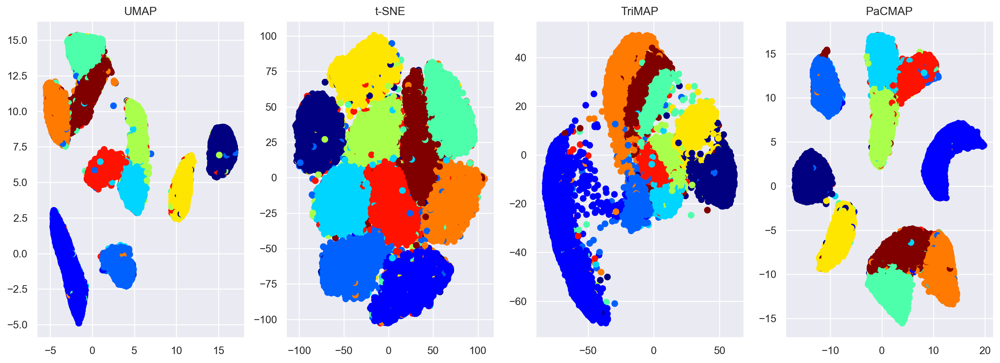

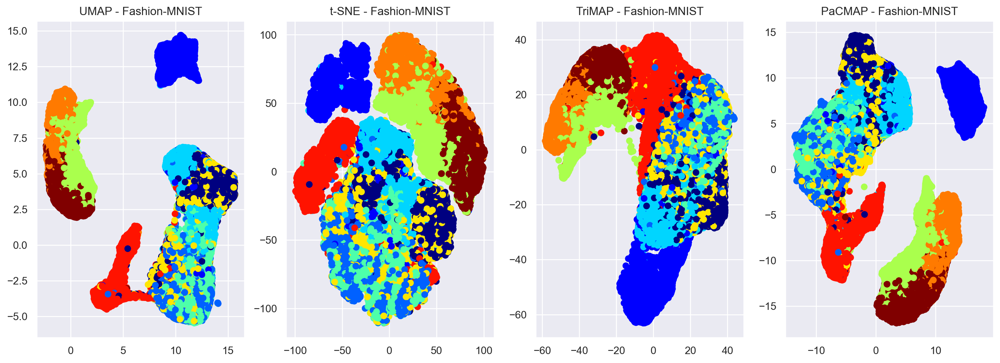

In [32]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.datasets import fetch_openml
import umap.umap_ as umap
import trimap.trimap_ as trimap
from pacmap import PaCMAP  # Upewnij się, że pacmap jest zainstalowany

# Załaduj zbiory danych
mnist = fetch_openml('mnist_784', version=1, as_frame=False)
fmnist = fetch_openml('Fashion-MNIST', version=1, as_frame=False)

# Przygotuj dane
X_mnist = mnist.data
y_mnist = mnist.target.astype(int)
X_fmnist = fmnist.data
y_fmnist = fmnist.target.astype(int)

# Wykonaj redukcję wymiarowości i wykreśl wyniki dla MNIST
tsne_mnist = TSNE(n_components=2, learning_rate='auto', init='random').fit_transform(X_mnist)
umap_mnist = umap.UMAP(n_components=2).fit_transform(X_mnist)
# Możesz odkomentować poniższą linię jeśli masz zainstalowany TriMAP
trimap_mnist = trimap.TRIMAP().fit_transform(X_mnist) 
pacmap_mnist = PaCMAP(n_components=2).fit_transform(X_mnist)  # PaCMAP

# Wykreśl wyniki na wykresach punktowych
fig, axes = plt.subplots(1, 4, figsize=(18, 6))  # Zmieniono liczbę subplots na 3
axes[0].scatter(umap_mnist[:, 0], umap_mnist[:, 1], c=y_mnist, cmap='jet')
axes[0].set_title('UMAP')
axes[1].scatter(tsne_mnist[:, 0], tsne_mnist[:, 1], c=y_mnist, cmap='jet')
axes[1].set_title('t-SNE')
axes[2].scatter(trimap_mnist[:, 0], trimap_mnist[:, 1], c=y_mnist, cmap='jet')  # Odkomentuj jeśli używasz TriMAP
axes[2].set_title('TriMAP')
axes[3].scatter(pacmap_mnist[:, 0], pacmap_mnist[:, 1], c=y_mnist, cmap='jet')  # PaCMAP
axes[3].set_title('PaCMAP')
plt.show()

# Wykonaj redukcję wymiarowości i wykreśl wyniki dla Fashion-MNIST
tsne_fmnist = TSNE(n_components=2, learning_rate='auto', init='random').fit_transform(X_fmnist)
umap_fmnist = umap.UMAP(n_components=2).fit_transform(X_fmnist)
# Możesz odkomentować poniższą linię jeśli masz zainstalowany TriMAP
trimap_fmnist = trimap.TRIMAP().fit_transform(X_fmnist) 
pacmap_fmnist = PaCMAP(n_components=2).fit_transform(X_fmnist)  # PaCMAP

# Wykreśl wyniki na wykresach punktowych
fig, axes = plt.subplots(1, 4, figsize=(18, 6))  # Zmieniono liczbę subplots na 3
axes[0].scatter(umap_fmnist[:, 0], umap_fmnist[:, 1], c=y_fmnist, cmap='jet')
axes[0].set_title('UMAP - Fashion-MNIST')
axes[1].scatter(tsne_fmnist[:, 0], tsne_fmnist[:, 1], c=y_fmnist, cmap='jet')
axes[1].set_title('t-SNE - Fashion-MNIST')
axes[2].scatter(trimap_fmnist[:, 0], trimap_fmnist[:, 1], c=y_fmnist, cmap='jet')  # Odkomentuj jeśli używasz TriMAP
axes[2].set_title('TriMAP - Fashion-MNIST')
axes[3].scatter(pacmap_fmnist[:, 0], pacmap_fmnist[:, 1], c=y_fmnist, cmap='jet')  # PaCMAP
axes[3].set_title('PaCMAP - Fashion-MNIST')
plt.show()



#### IMPORTANT: In order to compare the results of methods above:
1) Use metrics script provided as attachment to this lab.
2) Design a $cf_{nn}$ metric using the formula: $cf=\frac{\sum_{{\text{\it nn}}=1}^{{\text{\it nn}}_{\max}}cf_{\text{\it nn}}}{nn_{\max}}$, $cf_{\text{\it nn}}=\frac{\sum_{i=1}^{M}nn(i)}{nn{\cdot} M}$, where $nn(i)$ is the number of nearest neighbors of $y_i$ in the space $Y$, which belong to the same class as $x_i$. The value of $cf$ is calculated for an arbitrarily defined value of $nn_{max}$ depending on the number of feature vectors in the class. To reflect a wide range of embedding properties, we use $nn_{max}=100$. The value of $cf \sim 1$ for well separated and pure classes, while $cf \sim \frac{1}{K}$ for random points in the $K$ class. 

In [36]:
from time import time
import math
import random
import mkl
import glob

import numpy as np
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt
from scipy import stats
from mpl_toolkits.mplot3d import Axes3D
from PIL import Image
from matplotlib.cbook import get_sample_data
from matplotlib.offsetbox import TextArea, DrawingArea, OffsetImage, AnnotationBbox
from IPython.display import Image
import tensorflow as tf
from tensorflow import keras

sn.set(color_codes=True)
np.random.seed(1234)
mkl.set_num_threads(4)
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.rcParams["figure.figsize"] = [20, 20]

In [38]:
import numba
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random

from scipy.spatial.distance import squareform, pdist
from sklearn.model_selection import train_test_split

markers = ["x", "o", "s", "*", "^", ".", "X"]
colors = ["red", "blue", "green", "brown", "orange", "cyan", "grey", "purple"]


# @numba.jit(nopython=True)
def knngain(d_hd, d_ld, labels):
    # Number of data points
    N = d_hd.shape[0]
    N_1 = N - 1
    k_hd = np.zeros(shape=N_1, dtype=np.int64)
    k_ld = np.zeros(shape=N_1, dtype=np.int64)
    # For each data point
    for i in range(N):
        c_i = labels[i]
        di_hd = d_hd[i, :].argsort(kind="mergesort")
        di_ld = d_ld[i, :].argsort(kind="mergesort")
        # Making sure that i is first in di_hd and di_ld
        for arr in [di_hd, di_ld]:
            for idj, j in enumerate(arr):
                if j == i:
                    idi = idj
                    break
            if idi != 0:
                arr[idi] = arr[0]
            arr = arr[1:]
        for k in range(N_1):
            if c_i == labels[di_hd[k]]:
                k_hd[k] += 1
            if c_i == labels[di_ld[k]]:
                k_ld[k] += 1
    # Computing the KNN gain
    gn = (k_ld.cumsum() - k_hd.cumsum()).astype(np.float64) / (
        (1.0 + np.arange(N_1)) * N
    )
    # Returning the KNN gain and its AUC
    return gn, eval_auc(gn)


@numba.jit(nopython=True)
def eval_auc(arr):
    i_all_k = 1.0 / (np.arange(arr.size) + 1.0)
    return np.float64(arr.dot(i_all_k)) / (i_all_k.sum())


@numba.jit(nopython=True)
def eval_rnx(Q):
    N_1 = Q.shape[0]
    N = N_1 + 1
    # Computing Q_NX
    qnxk = np.empty(shape=N_1, dtype=np.float64)
    acc_q = 0.0
    for K in range(N_1):
        acc_q += Q[K, K] + np.sum(Q[K, :K]) + np.sum(Q[:K, K])
        qnxk[K] = acc_q / ((K + 1) * N)
    # Computing R_NX
    arr_K = np.arange(N_1)[1:].astype(np.float64)
    rnxk = (N_1 * qnxk[: N_1 - 1] - arr_K) / (N_1 - arr_K)
    # Returning
    return rnxk


def eval_dr_quality(d_hd, d_ld):
    # Computing the co-ranking matrix of the embedding, and the R_{NX}(K) curve.
    rnxk = eval_rnx(Q=coranking(d_hd=d_hd, d_ld=d_ld))
    # Computing the AUC, and returning.
    return rnxk, eval_auc(rnxk)


def coranking(d_hd, d_ld):
    # Computing the permutations to sort the rows of the distance matrices in HDS and LDS.
    perm_hd = d_hd.argsort(axis=-1, kind="mergesort")
    perm_ld = d_ld.argsort(axis=-1, kind="mergesort")

    N = d_hd.shape[0]
    i = np.arange(N, dtype=np.int64)
    # Computing the ranks in the LDS
    R = np.empty(shape=(N, N), dtype=np.int64)
    for j in range(N):
        R[perm_ld[j, i], j] = i
    # Computing the co-ranking matrix
    Q = np.zeros(shape=(N, N), dtype=np.int64)
    for j in range(N):
        Q[i, R[perm_hd[j, i], j]] += 1
    # Returning
    return Q[1:, 1:]


def viz_qa(
    Ly,
    ymin=None,
    ymax=None,
    Lmarkers=None,
    Lcols=None,
    Lleg=None,
    Lls=None,
    Lmedw=None,
    Lsdots=None,
    lw=2,
    markevery=0.1,
    tit="",
    folder_name="",
    xlabel="",
    ylabel="",
    alpha_plot=0.9,
    alpha_leg=0.8,
    stit=25,
    sax=20,
    sleg=15,
    zleg=1,
    loc_leg="best",
    ncol_leg=1,
    lMticks=10,
    lmticks=5,
    wMticks=2,
    wmticks=1,
    nyMticks=11,
    mymticks=4,
    grid=True,
    grid_ls="solid",
    grid_col="lightgrey",
    grid_alpha=0.7,
    xlog=True,
):
    # Number of curves
    nc = len(Ly)
    # Checking the parameters
    if ymin is None:
        ymin = np.min(np.asarray([arr.min() for arr in Ly]))
    if ymax is None:
        ymax = np.max(np.asarray([arr.max() for arr in Ly]))
    if Lmarkers is None:
        Lmarkers = ["x"] * nc
    if Lcols is None:
        Lcols = ["blue"] * nc
    if Lleg is None:
        Lleg = [None] * nc
        add_leg = False
    else:
        add_leg = True
    if Lls is None:
        Lls = ["solid"] * nc
    if Lmedw is None:
        Lmedw = [float(lw) / 2.0] * nc
    if Lsdots is None:
        Lsdots = [12] * nc

    # Setting the limits of the y-axis
    y_lim = [ymin, ymax]

    # Defining the ticks on the y-axis
    yMticks = np.linspace(
        start=ymin, stop=ymax, num=nyMticks, endpoint=True, retstep=False
    )
    ymticks = np.linspace(
        start=ymin,
        stop=ymax,
        num=1 + mymticks * (nyMticks - 1),
        endpoint=True,
        retstep=False,
    )
    yMticksLab = [int(round(v * 100.0)) / 100.0 for v in yMticks]

    # Initial values for xmin and xmax
    xmin, xmax = 1, -np.inf

    fig = plt.figure(figsize=(16, 12))
    ax = fig.add_subplot(111)
    if xlog:
        fplot = ax.semilogx
    else:
        fplot = ax.plot

    # Plotting the data
    for id, y in enumerate(Ly):
        x = np.arange(start=1, step=1, stop=y.size + 0.5, dtype=np.int64)
        xmax = max(xmax, x[-1])
        fplot(
            x,
            y,
            label=Lleg[id],
            alpha=alpha_plot,
            color=Lcols[id],
            linestyle=Lls[id],
            lw=lw,
            marker=Lmarkers[id],
            markeredgecolor=Lcols[id],
            markeredgewidth=Lmedw[id],
            markersize=Lsdots[id],
            dash_capstyle="round",
            solid_capstyle="round",
            dash_joinstyle="round",
            solid_joinstyle="round",
            markerfacecolor=Lcols[id],
            markevery=markevery,
        )

    # Setting the limits of the axes
    ax.set_xlim([xmin, xmax])
    ax.set_ylim(y_lim)

    # Setting the major and minor ticks on the y-axis
    ax.set_yticks(yMticks, minor=False)
    ax.set_yticks(ymticks, minor=True)
    ax.set_yticklabels(yMticksLab, minor=False, fontsize=sax)

    # Defining the legend
    if add_leg:
        leg = ax.legend(
            loc=loc_leg,
            fontsize=sleg,
            markerfirst=True,
            fancybox=True,
            framealpha=alpha_leg,
            ncol=ncol_leg,
        )
        if zleg is not None:
            leg.set_zorder(zleg)

    # Setting the size of the ticks labels on the x axis
    for tick in ax.xaxis.get_major_ticks():
        tick.label.set_fontsize(sax)

    # Setting ticks length and width
    ax.tick_params(axis="both", length=lMticks, width=wMticks, which="major")
    ax.tick_params(axis="both", length=lmticks, width=wmticks, which="minor")

    # Setting the positions of the labels
    ax.xaxis.set_tick_params(labelright=False, labelleft=True)
    ax.yaxis.set_tick_params(labelright=False, labelleft=True)

    # Adding the grids
    if grid:
        ax.xaxis.grid(
            True, linestyle=grid_ls, which="major", color=grid_col, alpha=grid_alpha
        )
        ax.yaxis.grid(
            True, linestyle=grid_ls, which="major", color=grid_col, alpha=grid_alpha
        )
    ax.set_axisbelow(True)

    ax.set_title(tit, fontsize=stit)
    ax.set_xlabel(xlabel, fontsize=sax)
    ax.set_ylabel(ylabel, fontsize=sax)
    # plt.tight_layout()




class LocalMetric:
    def __init__(self):
        self.L_rnx = []
        self.L_kg = []
        self.Lleg_rnx = []
        self.Lleg_kg = []
        self.Lls = []
        self.number_of_methods = 0

    def calculate_knn_gain_and_dr_quality(
        self,
        X_lds: np.ndarray,
        X_hds: np.ndarray,
        labels: np.ndarray,
        method_name: str,
    ):

        (
            X_hds_train,
            X_hds_test,
            X_lds_train,
            X_lds_test,
            labels_train,
            labels_test,
        ) = train_test_split(X_hds, X_lds, labels, test_size=0.15)

        print("Calculating d_hd")
        d_hd = squareform(X=pdist(X=X_hds_test, metric="euclidean"), force="tomatrix")

        print(method_name)
        d_ld = squareform(X=pdist(X=X_lds_test, metric="euclidean"), force="tomatrix")
        rnxk, auc_rnx = eval_dr_quality(d_hd=d_hd, d_ld=d_ld)
        kg, auc_kg = knngain(d_hd=d_hd, d_ld=d_ld, labels=labels_test)

        self.L_rnx.append(rnxk)
        self.L_kg.append(kg)
        self.Lleg_rnx.append(
            "{} {}".format(int(round(auc_rnx * 1000)) / 1000.0, method_name)
        )
        self.Lleg_kg.append(
            "{} {}".format(int(round(auc_kg * 1000)) / 1000.0, method_name)
        )
        self.Lls.append("solid")
        self.number_of_methods = self.number_of_methods + 1

    def visualize(self):
        Lmarkers = random.sample(markers, self.number_of_methods)
        Lcols = random.sample(colors, self.number_of_methods)
        Lmedw = [1.0] * self.number_of_methods
        Lsdots = [12] * self.number_of_methods

        viz_qa(
            Ly=self.L_rnx,
            Lmarkers=Lmarkers,
            Lcols=Lcols,
            Lleg=self.Lleg_rnx,
            Lls=self.Lls,
            Lmedw=Lmedw,
            Lsdots=Lsdots,
            tit="DR quality",
            xlabel="Neighborhood size $K$",
            ylabel="$R_{NX}(K)$",
        )

        viz_qa(
            Ly=self.L_kg,
            Lmarkers=Lmarkers,
            Lcols=Lcols,
            Lleg=self.Lleg_kg,
            Lls=self.Lls,
            Lmedw=Lmedw,
            Lsdots=Lsdots,
            tit="KNN gain",
            xlabel="Neighborhood size $K$",
            ylabel="$G_{NN}(K)$",
        )

        print("Finished.")


# if __name__ == "__main__":
#     local_metrics = LocalMetric()
#
#     # embed dataset using some method (low-dimensional space)
#     X_embedded = method["object"].fit_transform(X)
#
#     # X.values is original dataset (high-dimensional space)
#     local_metrics.calculate_knn_gain_and_dr_quality(
#         X_lds=X_embedded,
#         X_hds=X.values,
#         labels=labels.values,
#         method_name="{} {}".format(dataset_name, method["name"]),
#     )

In [ ]:
from sklearn.manifold import TSNE
from sklearn import datasets
import numpy as np

# Załaduj zbiór danych MNIST
mnist = datasets.fetch_openml('mnist_784', version=1)

# Stwórz instancję TSNE
tsne = TSNE(n_components=2, random_state=42)

# Przypisz osadzenia t-SNE do X_embedded
X_embedded = tsne.fit_transform(mnist.data)

# Teraz możesz obliczyć metryki DR używając X_embedded
local_metrics.calculate_knn_gain_and_dr_quality(
    X_lds=X_embedded,
    X_hds=mnist.data.values,
    labels=mnist.target.values,
    method_name="{} {}".format("MNIST", "t-SNE")
)


C:\Users\KlaudiaDyl\miniforge3\envs\minifold\Lib\site-packages\sklearn\datasets\_openml.py:1002: FutureWarning: The default value of `parser` will change from `'liac-arff'` to `'auto'` in 1.4. You can set `parser='auto'` to silence this warning. Therefore, an `ImportError` will be raised from 1.4 if the dataset is dense and pandas is not installed. Note that the pandas parser may return different data types. See the Notes Section in fetch_openml's API doc for details.
  warn(


KeyboardInterrupt: 

Exception ignored in: 'zmq.backend.cython.message.Frame.__dealloc__'
Traceback (most recent call last):
  File "zmq\\backend\\cython\\checkrc.pxd", line 13, in zmq.backend.cython.checkrc._check_rc
KeyboardInterrupt: 


In [40]:
import numpy as np

def calculate_separation(X, labels):
    classes = np.unique(labels)
    class_centers = np.array([X[labels == c].mean(axis=0) for c in classes])
    intra_class_var = np.mean([np.var(X[labels == c], axis=0).mean() for c in classes])
    
    inter_class_dist = np.mean([np.linalg.norm(center1 - center2) 
                                for i, center1 in enumerate(class_centers) 
                                for j, center2 in enumerate(class_centers) if i != j])
    
    return inter_class_dist / intra_class_var

# Przykład użycia:
print("Results for mnist:")
print(f'- for UMAP: {calculate_separation(umap_fmnist, y_fmnist)}')
print(f'- for t-SNE: {calculate_separation(tsne_fmnist, y_fmnist)}')
print(f'- for TRIPAM: {calculate_separation(trimap_fmnist, y_fmnist)}')

print("Results for fmnist:")
print(f'- for UMAP: {calculate_separation(umap_mnist, y_mnist)}')
print(f'- for t-SNE: {calculate_separation(tsne_mnist, y_mnist)}')
print(f'- for TRIPAM: {calculate_separation(trimap_mnist, y_mnist)}')


Results for mnist:
- for UMAP: 2.919609308242798
- for t-SNE: 0.1354025900363922
- for TRIPAM: 0.4909464418888092
Results for fmnist:
- for UMAP: 5.067965507507324
- for t-SNE: 0.29279330372810364
- for TRIPAM: 0.6223862171173096



Otrzymane metryki wskazują na stopień rozdzielenia klas – wyższe wartości sygnalizują lepszą separację między klasami. Wartości mniejsze niż jeden sugerują, że klasy nie są wystarczająco wyraźnie oddzielone, znajdując się zbyt blisko siebie w zredukowanej przestrzeni cech. Wartość dla zbioru MNIST dla UMA oraz FMNIST zmacznie odbiega od normy, co wskazuje na błędy obliczeń.